# Progetto di Data and Web mining

Matteo Spanio, A.A. 2021/2022

# Esplorazione e preparazione dei dati

Il dataset fornito per il [Zillow Prize](https://www.kaggle.com/competitions/zillow-prize-1/overview) è una collezione delle caratteristiche di alcune case vendute nella zona vicino a Los Angeles tra il 2016 e il 2017.

Il valore che si chiede di predirre nella competizione è il *logerror*, cioè la differenza tra il logaritmo del valore della proprietà stimato dall'algoritmo Zestimate e il logaritmo del valore effettivo a cui è stata venduta la casa, quindi logerror negativi indicano che il valore della casa è stato sottostimato, viceversa per i valori positivi

$$
logerror = \log(Zestimate) - \log(SalePrice)
$$

l'obiettivo è minimizzare il *mean absolute error* sulle predizioni del logerror.

## Import e merge

Innanzitutto diamo uno sguardo ai dati del 2016:

<div class='alert alert-warning'>
La libreria Zillow è allegata ai notebook e contiene numerose funzioni e classi che ho creato per semplificare alcuni processi ripetitivi, oltre a cercare di rendere più leggibile il codice.
<div>

In [1]:
import pandas as pd
import numpy as np

import Zillow.data as zd

# read files containing features
raw_2016_features = zd.get_raw_features(2016)
raw_2017_features = zd.get_raw_features(2017)

# read target data
raw_logerr_2016 = zd.get_raw_y(2016)
raw_logerr_2017 = zd.get_raw_y(2017)

In [2]:
raw_2016_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2985217 entries, 0 to 2985216
Data columns (total 58 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   parcelid                      int64  
 1   airconditioningtypeid         float64
 2   architecturalstyletypeid      float64
 3   basementsqft                  float64
 4   bathroomcnt                   float64
 5   bedroomcnt                    float64
 6   buildingclasstypeid           float64
 7   buildingqualitytypeid         float64
 8   calculatedbathnbr             float64
 9   decktypeid                    float64
 10  finishedfloor1squarefeet      float64
 11  calculatedfinishedsquarefeet  float64
 12  finishedsquarefeet12          float64
 13  finishedsquarefeet13          float64
 14  finishedsquarefeet15          float64
 15  finishedsquarefeet50          float64
 16  finishedsquarefeet6           float64
 17  fips                          float64
 18  fireplacecnt          

In [3]:
raw_logerr_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90275 entries, 0 to 90274
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   parcelid         90275 non-null  int64  
 1   logerror         90275 non-null  float64
 2   transactiondate  90275 non-null  object 
dtypes: float64(1), int64(1), object(1)
memory usage: 2.1+ MB


In [4]:
raw_2017_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2985217 entries, 0 to 2985216
Data columns (total 58 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   parcelid                      int64  
 1   airconditioningtypeid         float64
 2   architecturalstyletypeid      float64
 3   basementsqft                  float64
 4   bathroomcnt                   float64
 5   bedroomcnt                    float64
 6   buildingclasstypeid           float64
 7   buildingqualitytypeid         float64
 8   calculatedbathnbr             float64
 9   decktypeid                    float64
 10  finishedfloor1squarefeet      float64
 11  calculatedfinishedsquarefeet  float64
 12  finishedsquarefeet12          float64
 13  finishedsquarefeet13          float64
 14  finishedsquarefeet15          float64
 15  finishedsquarefeet50          float64
 16  finishedsquarefeet6           float64
 17  fips                          float64
 18  fireplacecnt          

In [5]:
raw_logerr_2017.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77613 entries, 0 to 77612
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   parcelid         77613 non-null  int64  
 1   logerror         77613 non-null  float64
 2   transactiondate  77613 non-null  object 
dtypes: float64(1), int64(1), object(1)
memory usage: 1.8+ MB


<div class='alert alert-info'>
    
**NB**: nei file con i valori dei logerror si presentano più volte gli stessi `parcelid` con date di vendita diverse (cioè la stessa casa è stata venduta più volte in diversi momenti dell'anno).

Bisogna decidere se eliminare le transazioni delle stesse case o se sia meglio tenere conto delle piccole variazioni che hanno le proprietà tra una vendita e l'altra.
    
Mantenere i dati permette di modellare le stime dei modelli sugli eventi temporali (si può vedere se la stessa casa venduta in due momenti dell'anno diversi fa cambiare il valore del logerror), ma aggiunge righe quasi uguali che potrebbero andare ad avere un effetto sul peso delle differenti feature. Ad ogni modo ho deciso di tenere in memoria tutte le transazioni in quanto si tratta di poche centinaia e ci si aspetta che abbiano un piccolo peso sulla media delle colonne. Inoltre il contest chiede di effettuare previsioni sull'errore in base al mese e all'anno, quindi se lo stesso lotto è stato venduto più volte in date diverse potrebbe essere un dato rilevante in cui si evidenzierebbero variazioni di `logerror` col passare del tempo.

</div>

In [6]:
zd.read_unique('2016 dataset', raw_logerr_2016)
zd.read_unique('2017 dataset', raw_logerr_2017)

2016 dataset has 90275 transactions on 90150 different properties.
2017 dataset has 77613 transactions on 77414 different properties.


Visto che le transazioni a disposizione sono molte meno delle proprietà registrate unisco i dataset e li salvo su file per poter effettuare operazioni sui dati più agevolmente

In [7]:
# merge everything in a single dataframe
df_2016 = zd.merge_x_y(raw_2016_features, raw_logerr_2016, on='parcelid', with_duplicates=True)
df_2017 = zd.merge_x_y(raw_2017_features, raw_logerr_2017, on='parcelid', with_duplicates=True)

df_2016.to_csv('./Zillow/dataset/2016_data_exploration.csv')
df_2017.to_csv('./Zillow/dataset/2017_data_exploration.csv')

## Osservazione delle features

Prima di andare ad osservare i dati divido il dataset di modo da poter effettuare le valutazioni sul dataset di train e alla fine vedere le prestazioni dei modelli su dei dati mai analizzati. 

In [1]:
from sklearn.model_selection import train_test_split
from Zillow.data import split_x_y, get_dataset, merge_x_y

# load a dataset with 2016 and 2017 data
df_total = get_dataset()

# drop auto generated column
df_total = df_total.drop('Unnamed: 0', axis=1)

X, y = split_x_y(df_total)

X_train_total, X_test, y_train_total, y_test = train_test_split(X, y,
                                                              test_size=0.2,
                                                              random_state=42)

X_train, X_validation, y_train, y_validation = train_test_split(X_train_total,
                                                                y_train_total,
                                                                test_size=0.2,
                                                                random_state=32)

test_data = merge_x_y(X_train_total, y_train_total, with_duplicates=True,
                      left_index=True, right_index=True)
test_data.to_csv('./Zillow/dataset/train_total_dataset.csv')

test_data = merge_x_y(X_test, y_test, with_duplicates=True,
                      left_index=True, right_index=True)
test_data.to_csv('./Zillow/dataset/test_dataset.csv')

validation_data = merge_x_y(X_validation, y_validation,
                            with_duplicates=True, left_index=True, right_index=True)
validation_data.to_csv('./Zillow/dataset/validation_dataset.csv')

df = merge_x_y(X_train, y_train, with_duplicates=True,
               left_index=True, right_index=True)
df.to_csv('./Zillow/dataset/train_dataset.csv')

print('train:', len(X_train), 'test:', len(X_test), 'validation:', len(X_validation))

train: 107448 test: 33578 validation: 26862


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 107448 entries, 167185 to 140078
Data columns (total 60 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   logerror                      107448 non-null  float64
 1   parcelid                      107448 non-null  int64  
 2   transactiondate               107448 non-null  object 
 3   airconditioningtypeid         34448 non-null   float64
 4   architecturalstyletypeid      289 non-null     float64
 5   basementsqft                  59 non-null      float64
 6   bathroomcnt                   107432 non-null  float64
 7   bedroomcnt                    107432 non-null  float64
 8   buildingclasstypeid           16 non-null      float64
 9   buildingqualitytypeid         68540 non-null   float64
 10  calculatedbathnbr             106269 non-null  float64
 11  decktypeid                    774 non-null     float64
 12  finishedfloor1squarefeet      8269 non-

Si nota a colpo d'occhio che mancano molti dati, probabilmente alcune feature risulteranno inutilizzabili per via di queste mancanze, inoltre, dai nomi di alcune caratteristiche, sembra che ci sia una certa ridondanza: si notino le colonne contenenti le stringa `finishedsquarefeet`, `pool`, `yardbuildingsqft`, `taxvalue` in linea di massima [questa conversazione](https://www.kaggle.com/c/zillow-prize-1/discussion/34168) chiarisce che esistono diverse feature relative alla stessa quantità/qualità e vengono collezionate separatamente e poi riunite in statistiche riassuntive su cui si basa l'argoritmo Zestimate.

## Feature engeneering

Prima di compiere qualsiasi operazione potrebbe tornare utile creare una nuova feature in cui si vanno a contare per ogni riga il numero di feature mancanti, dal momento che stiamo cercando di stimare l'errore di previsione del modello di Zillow, la quantità di dati mancanti potrebbe essere un buono stimatore per quantificare gli errori.

In [3]:
from Zillow.types import MoreFeatures as mft

df['nan_cnt'] = df.isna().sum(axis=1)
print(df['nan_cnt'].unique())

[27 29 28 30 25 26 32 31 24 23 38 22 33 37 34 39 57 21 40 35 20 42 41 36
 19]


Alcune righe hanno 57 (tutte) features prive di valore, vanno quindi rimosse

In [4]:
# il valore di threshold è 5 in quanto parcelid, nan_cnt, transactiondate e logerror sono non nulli
df = df.dropna(axis=0, how='any', thresh=5)

Quindi rimuovo le colonne con meno di 100 valori registrati, si tratta di informazioni così esigue da risultare inutili

In [5]:
df = df.dropna(axis=1, thresh=100)

Zillow propone una [descrizione delle features](https://www.kaggle.com/competitions/zillow-prize-1/data), alcuni campi hanno comunque una descrizione identica, in quel caso si vedrà cosa fare di volta in volta, ma in generale si preferirà mantenere la colonna con meno dati mancanti a parità di significato.

Si noti che ci sono numerose variabili categoriali: per comodità aggiungo alcune colonne in cui sostituisco i valori numerici delle categorie con le loro etichette di modo da rendere più leggibile l'analisi

In [6]:
from Zillow.types import Features as ft, MoreFeatures as mft
import Zillow.data as zd

# replace the type id of the land with its label
df['land_use_label'] = df['propertylandusetypeid'].replace(zd.property_land_use_type)

# replace the air cooler type id with its label
df['air_cooler_label'] = df['airconditioningtypeid'].replace(zd.air_conditioning_dict)

# replace the county id with its name
df['county_name'] = df['regionidcounty'].replace(zd.county_dict)

Inoltre si apprende dalla descrizione delle features che alcuni dati sono stati inseriti con una scala diversa da quella standard e hanno quindi bisogno di essere ritrasformati prima di poterci fare qualcosa

In [7]:
# latitude and latitude have been multiplied by 10e6
df['latitude']  = df['latitude']  / 10e5
df['longitude'] = df['longitude'] / 10e5

Bisogna poi tener conto del tipo di dato, in particolare quelli di tipo `object` non vengono gestiti da `sklearn`, verranno quindi trasformati e/o rimossi.

Volendo mantenere traccia del momento della transazione trasformiamo subito la data in giorni del mese, giorno della settimana, giorno del mese e anno. Per il momento inseriamo una nuova etichetta in formato stringa, verranno poi rimosse dopo aver effettuato un one hot encoding per trasformarle in variabili categoriali.

In [8]:
import pandas as pd
import Zillow.transform as zt
from Zillow.types import Features as ft, MoreFeatures as mft

df['transactiondate'] = pd.to_datetime(df['transactiondate'],
                                               format='%Y-%m-%d')
df['transaction_month'] = df.transactiondate.dt.month_name()
df['transaction_month_day'] = df.transactiondate.dt.day
df['transaction_week_day'] = df.transactiondate.dt.day_name()
df['transaction_year'] = df.transactiondate.dt.year

I campi `taxdelinquencyflag` e `taxdelinquencyyear` registrano se non sia stata pagata la tassa di proprietà e, se non è stata pagata, da quanti anni. Se si dà uno sguardo alle colonne si osserva che i valori nan corrispondono probabilmente alle case in cui sono state pagate le tasse (per fortuna la maggior parte!), si intuisce quindi che porre i valori nan a 0 non dovrebbe alterare lo stato dei dati

In [9]:
print(df['taxdelinquencyyear'].unique(), df['taxdelinquencyflag'].unique())

[nan 15. 13. 11. 14. 12.  8.  9. 10.  7.  6.  4. 99.  3.] [nan 'Y']


In [10]:
sum(df['taxdelinquencyyear'].isna()), sum(df['taxdelinquencyflag'].isna())

(104455, 104455)

In [11]:
df['taxdelinquencyflag'] = df['taxdelinquencyflag'].fillna(0.)
df['taxdelinquencyflag'] = df['taxdelinquencyflag'].replace({'Y': 1.})

df['taxdelinquencyyear'] = df['taxdelinquencyyear'].fillna(0.)

print(df['taxdelinquencyyear'].unique(), df['taxdelinquencyflag'].unique())

[ 0. 15. 13. 11. 14. 12.  8.  9. 10.  7.  6.  4. 99.  3.] [0. 1.]


Le colonne `fireplaceflag` e `fireplacecnt` indicano la presenza del camino nella casa, ma, come si vede dal riepilogo dei dati, la flag segnala solo 238 record con camino, mentre il contatore è maggiore di 0 su oltre 11mila proprietà. Intanto convertiamo la flag in valori 0 e 1, e assegnamo al contatore degli 0 al posto di nan

In [12]:
print(df.fireplaceflag.unique(), f"{sum(df.fireplaceflag.isna())} missing values")
print(df.fireplacecnt.unique(), f"{sum(df.fireplacecnt.isna())} missing values")

df['fireplaceflag'] = df['fireplaceflag'].fillna(0.)
df['fireplaceflag'] = df['fireplaceflag'].replace({True: 1.})

df['fireplacecnt'] = df['fireplacecnt'].fillna(0.)

[nan True] 107194 missing values
[nan  1.  2.  3.  4.  5.] 95924 missing values


Si vede dal grafico sottostante che le case con la flag a 1 non corrispondono ad alcun record di `fireplacecnt`, si tratta probabilmente di variabili raccolte in modi diversi o incomplete. Per avere una variabile verosimile in cui sia censita la presenza del camino ne creo una nuova assegnando il valore 1 a tutte le case che tra `fireplaceflag` e `fireplacecnt` ne segnalino la presenza, 0 altrimenti.

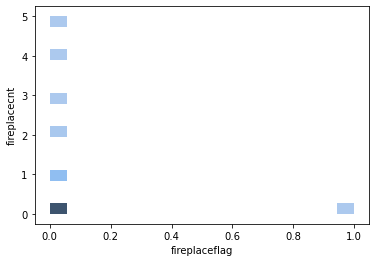

In [13]:
%matplotlib inline
import seaborn as sns

sns.histplot(data=df, x='fireplaceflag', y='fireplacecnt');

In [14]:
df['has_fireplace'] = 0
df.loc[df['fireplaceflag'] == 1, 'has_fireplace'] = 1
df.loc[df['fireplacecnt'] > 0, 'has_fireplace'] = 1

print(f'{sum(df["has_fireplace"])} properties have at least a fireplace')

11746 properties have at least a fireplace


Anche nel caso della flag per la spa sono state registrate solo le proprietà che ne hanno, banalmente assegno 0 a tutte le altre

In [15]:
df['hashottuborspa'] = df['hashottuborspa'].fillna(0.)
df['hashottuborspa'] = df['hashottuborspa'].replace({True: 1., False: 0.})

Applichiamo trasformazioni analoghe anche a `unitcnt` e `numberofstories` (in America i piani degli edifici sono detti *story*), in cui infatti non si trova il valore 0

In [16]:
print(df['unitcnt'].unique(), df['numberofstories'].unique())

[  1.  nan   4.   2.   3. 143.  70.   9.  45.   5.   6.] [nan  1.  2.  3.  4.]


In [17]:
df['unitcnt'] = df['unitcnt'].fillna(0.)
df['numberofstories'] = df['numberofstories'].fillna(0.)

Dal momento che la feature `poolcnt` contiene solo valori 1 e vogliamo sostituire i nan con degli 0, creiamo una nuova colonna dal nome più significativo `has_pool` di modo da poter rimuovere le colonne `pooltypeid`. La feature `poolsizesum` invece contiene solo 1470 record in confronto ai 27204 di poolcnt, risulta quindi fortemente mancante, in questa analisi ci limiteremo quindi a segnalare se la proprietà abbia o meno una piscina.

In [18]:
print(df['poolcnt'].unique())

[nan  1.]


In [19]:
df['poolcnt'] = df['poolcnt'].fillna(0.)
df['has_pool'] = df['poolcnt']
df.loc[df['poolcnt'] > 0, 'has_pool'] = 1

Si possono poi rimuovere le colonne da cui sono state generate le nuove features, si tratta di numeri non utilizzabili per la predizione in quanto non rappresentano un ordine e spesso sono molto distanti tra loro, sarà più facile ritrasformare le etichette generate con il one hot encoding.

In [20]:
droplist = [
    'parcelid', # non serve più l'id
    'assessmentyear', # contiene la stessa informazione di mft.transaction_year
    'transactiondate',
    'airconditioningtypeid',
    'propertylandusetypeid',
    'regionidcounty',
    'pooltypeid2',
    'pooltypeid10',
    'pooltypeid7',
    'poolcnt',
    'poolsizesum',
    'fireplaceflag',
    'fireplacecnt',
]

df = df.drop(droplist, axis=1)

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 107432 entries, 167185 to 140078
Data columns (total 53 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   logerror                      107432 non-null  float64
 1   architecturalstyletypeid      289 non-null     float64
 2   bathroomcnt                   107432 non-null  float64
 3   bedroomcnt                    107432 non-null  float64
 4   buildingqualitytypeid         68540 non-null   float64
 5   calculatedbathnbr             106269 non-null  float64
 6   decktypeid                    774 non-null     float64
 7   finishedfloor1squarefeet      8269 non-null    float64
 8   calculatedfinishedsquarefeet  106889 non-null  float64
 9   finishedsquarefeet12          102078 non-null  float64
 10  finishedsquarefeet15          4227 non-null    float64
 11  finishedsquarefeet50          8269 non-null    float64
 12  finishedsquarefeet6           529 non-n

Rimangono ora delle variabili che sono comunque troppo esigue per poter effettuare delle stime significative con questo campione, vanno quindi rimosse `architecturalstyletypeid`, `decktypeid`, `finishedsquarefeet6`, `finishedsquarefeet15`, `typeconstructiontypeid`.

Si procede poi a rimuovere le variabili ridondanti che spiegano la stessa feature basandosi sulla descrizione delle stesse: vengono rimosse `calculatedbathnbr`, `fullbathcnt`, `threequarterbathnbr`, `regionidneighborhood`, `regionidcity`, `fips`, `censustractandblock`, `rawcensustractandblock`. Per le seguenti features invece la descrizione non fornisce sufficienti dettagli per interpretarne i valori `propertycountylandusecode`, `propertyzoningdesc`.

Invece la feature generata `air_cooler_label` è troppo poco censita, si vorrebbe poter assegnare un valore di default ai valori nan, dalla descrizione però sono già state assegnate etichette col significato di assenza di aria condizionata, si genererebbe solo più confusione. Dal momento che non sappiamo se i valori nan corrispondano alla mancanza di refrigeratori o alla negligenza di chi ha raccolto i dati, e che un one hot encoding su una variabile con numerose etichette farebbe moltiplicare notevolmente la numerosità dei dati si decide di rimuovere la colonna.

In [22]:
droplist = [
    'architecturalstyletypeid',
    'decktypeid',
    'finishedsquarefeet6',
    'typeconstructiontypeid',
    'threequarterbathnbr',
    'calculatedbathnbr',
    'fullbathcnt',
    'regionidneighborhood',
    'fips',
    'finishedsquarefeet15',
    'propertyzoningdesc',
    'propertycountylandusecode',
    'regionidcity',
    'air_cooler_label',
    'rawcensustractandblock',
    'censustractandblock',
    'regionidzip'
]

df = df.drop(droplist, axis=1)

Alcune colonne che potrebbero tornare utili durante l'indagine tuttavia hanno ancora valori nulli, in questo caso, per non rinunciare alla feature si inserisce al posto dei valori mancanti la media della colonna e si aggiunge una nuova colonna in cui viene segnato se il valore è stato aggiunto artificialmente

In [23]:
import math
replace_with_mean = [
    'yearbuilt',
    'finishedsquarefeet12',
    'structuretaxvaluedollarcnt',
    'taxamount',
    'landtaxvaluedollarcnt',
    'taxvaluedollarcnt',
    'lotsizesquarefeet',
    'calculatedfinishedsquarefeet',
]

for label in replace_with_mean:
    df[label + '_was_nan'] = df[label].isna()
    df[label + '_was_nan'].replace({True: 1., False: 0.}, inplace=True)
    df[label] = df[label].fillna( math.floor( df[label].mean() ))

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 107432 entries, 167185 to 140078
Data columns (total 44 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   logerror                              107432 non-null  float64
 1   bathroomcnt                           107432 non-null  float64
 2   bedroomcnt                            107432 non-null  float64
 3   buildingqualitytypeid                 68540 non-null   float64
 4   finishedfloor1squarefeet              8269 non-null    float64
 5   calculatedfinishedsquarefeet          107432 non-null  float64
 6   finishedsquarefeet12                  107432 non-null  float64
 7   finishedsquarefeet50                  8269 non-null    float64
 8   garagecarcnt                          35527 non-null   float64
 9   garagetotalsqft                       35527 non-null   float64
 10  hashottuborspa                        107432 non-null  float64


Rimangono ancora variabili con valori mancanti che potrebbero essere significative, in quanto non ci sono altre variabili che contengano informazioni simili e non è facile aggiungere sostituire i nan con la media o degli 0, intanto lasciamole là, vediamo se ulteriori analisi ci aiuteranno a riempire gli spazi mancanti.

# Analisi grafiche

Avendo a disposizione le coordinate la prima cosa che viene spontanea è tracciare come siano distribuite le principali proprietà sulla mappa.

Cercando sulla mappa le coordinate delle proprietà si osserva che sono tutte nello stato della California, per la precisione, da Nord verso Sud, nelle contee di Ventura, Los Angeles e Orange (le contee americane sono una divisione dello stato in aree amministrative, come le regioni in Italia).

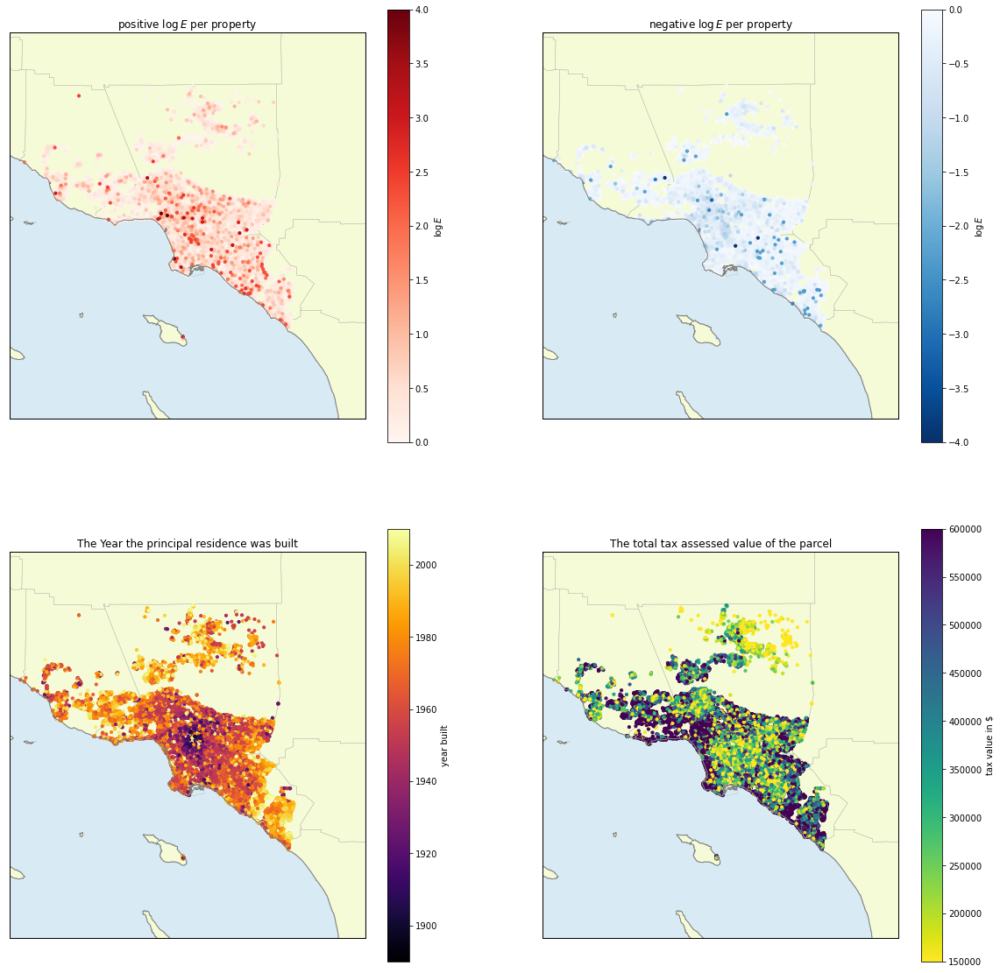

In [25]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import Zillow.data as zd
from Zillow.visualization import ZillowMap, create_labels_for_non_zero_land_use_types

fig, axs = plt.subplots(ncols=2, nrows=2 ,figsize=(20,20))

# plot 1
axs[0][0].set_title(r"positive $\log E$ per property")
m = ZillowMap(ax=axs[0][0])

map_data = df[df.logerror >= 0].sort_values(by=['logerror'])
points = m.scatter(map_data.longitude, map_data.latitude, s=10.,
          latlon=True, c=map_data.logerror, cmap='Reds')
points.set_clim(0, 4)
plt.colorbar(points, ax=axs[0][0], label=r'$\log E$')

# plot 2
axs[0][1].set_title(r"negative $\log E$ per property")
m = ZillowMap(ax=axs[0][1])

map_data = df[df.logerror < 0].sort_values(by=['logerror'], ascending=False)
points = m.scatter(map_data.longitude, map_data.latitude, s=10.,
          latlon=True, c=map_data.logerror, cmap='Blues_r')
points.set_clim(-4, 0)
plt.colorbar(points, ax=axs[0][1], label=r'$\log E$');

# plot 3
axs[1][0].set_title("The Year the principal residence was built")
m = ZillowMap(ax=axs[1][0])

points = m.scatter(df.longitude, df.latitude,
          latlon=True, c=df[ft.year_built.value], s=10., cmap='inferno')
points.set_clim(1890, 2010)
plt.colorbar(points, ax=axs[1][0], label=r'year built')

# plot 4
axs[1][1].set_title("The total tax assessed value of the parcel")
m = ZillowMap(ax=axs[1][1])

points = m.scatter(df.longitude, df.latitude,
          latlon=True, c=df[ft.total_tax_value_dollar.value], s=10., cmap='viridis_r')
points.set_clim(1.5e5,6e5)
plt.colorbar(points, ax=axs[1][1], label=r'tax value in $');

Si vede subito che la maggior parte delle case si trova nella contea di LA, dove tra l'altro sembra si trovino i *logerror* maggiori (in valore assoluto). A questo punto potrebbe essere interessante visualizzare le distribuzioni dei dati per contea e capire se vi siano altre differenze

In [25]:
plotting_features = []

# select only non categorical features
for col in df.columns.to_list():
    if len(df[col].unique()) > 3 and df.dtypes[col] != 'O': # 'O' stands for object
        plotting_features.append(col)

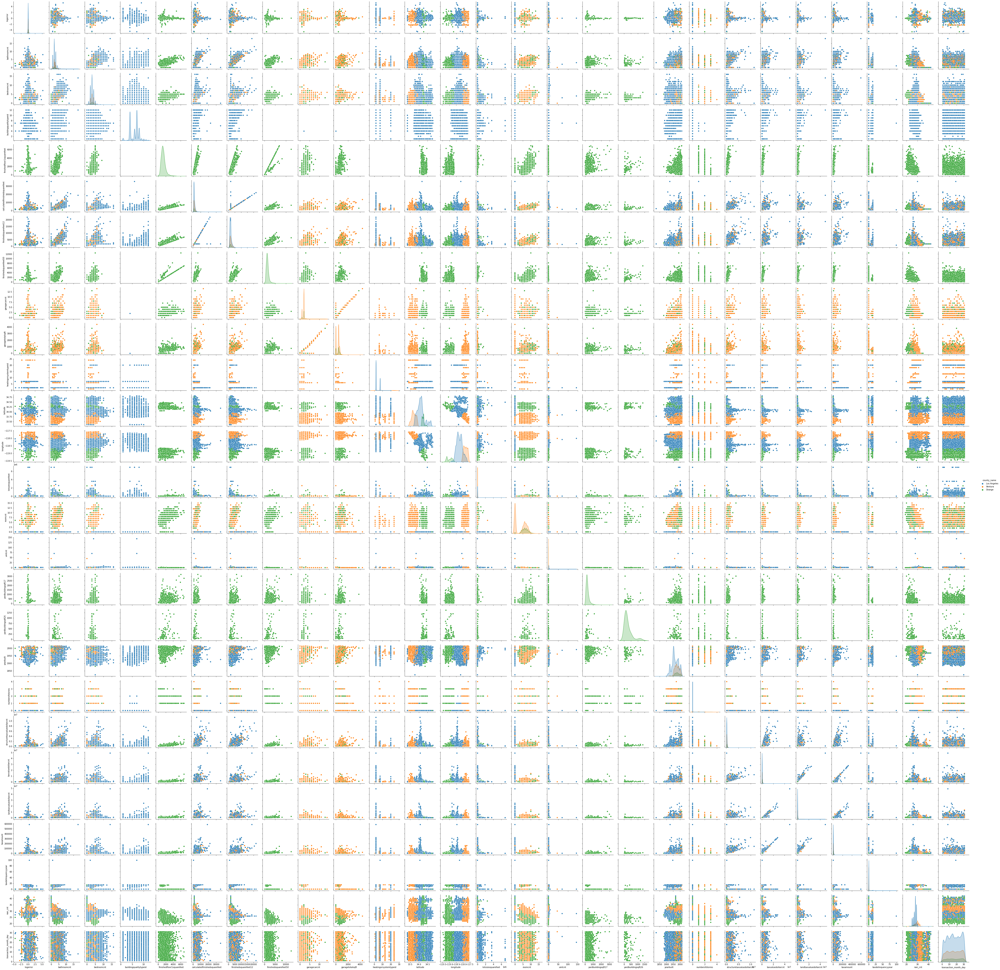

In [36]:
sns.pairplot(
    data=df,
    y_vars=plotting_features,
    x_vars=plotting_features,
    hue='county_name',
    diag_kind="auto",
);

Il grafico disegnato dà una buona rappresentazione delle relazioni tra le variabili nel dataset, e mette in luce diversi fattori:

1. molte feature sono completamente assenti per zone

2. alcune feature inseriscono evidentemente dati non corretti (e.g. si vede che tutti i record di Los Angeles hanno il valore `roomcnt` a 0)

3. diverse distribuzioni sono 'schiacciate' lungo uno degli assi, potrebbero esserci alcuni _outliers_ (forse dei dati inseriti erroneamente con valori eccessivamente fuori scala)

Dal momento che non possiamo sapere se le variabili che sono presenti solo per alcune contee siano pari a 0 nelle altre, o se semplicemente non sono state raccolte dovremo rinunciare a prendere in considerazione quelle colonne (o magari creare dei modelli adhoc per zona)

In [26]:
from Zillow.types import Features as ft

drop_list = [
    ft.room_cnt.value,
    ft.garage_sqft.value,
    ft.garage_car_cnt.value,
    ft.patio_in_yard_sqft.value,
    ft.living_area_first_floor_sqft.value,
    ft.finished_first_floor_sqft.value,
    ft.heating_system_type.value,
    ft.building_condition.value,
    ft.storage_building_in_yard_sqft.value,
]

df = df.drop(drop_list, axis=1)

Si può poi prendere in considerazione le variabili categoriali che abbiamo lasciato in sospeso. Attraverso istogrammi e boxplot siamo in grado di scoprire altre informazioni:
1. all'aumentare dei campioni si nota un aumento di varianza, in particolare i lotti residenziali sono i più numerosi e anche quelli in cui varia maggiormente il logerror
2. per tipologia di uso a cui è adibito il lotto, in media c'è una tendenza a sovrastimare (seppur di poco) il logerror, si vede che però la varianza cambia significativamente a seconda della categoria del lotto (e anche in base alla numerosità dei campioni)
3. a colpo d'occhio non si notano evidenze di correlazione tra logerror e il mese/giorno della transazione

In [43]:
plotting_categorical_features = []

# select only non categorical features
for col in df.columns.to_list():
    if len(df[col].unique()) <= 3 or df.dtypes[col] == 'O':
        plotting_categorical_features.append(col)
        
for x in ['land_use_label', 'transaction_month', 'transaction_week_day']:
    plotting_categorical_features.remove(x)

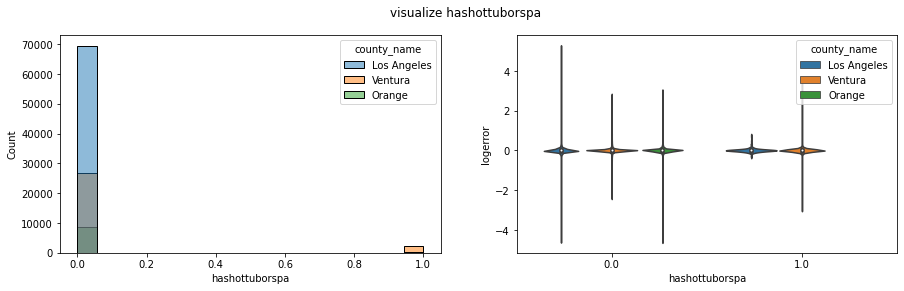

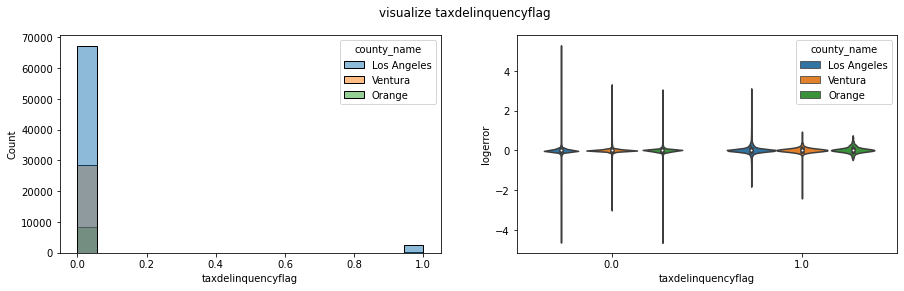

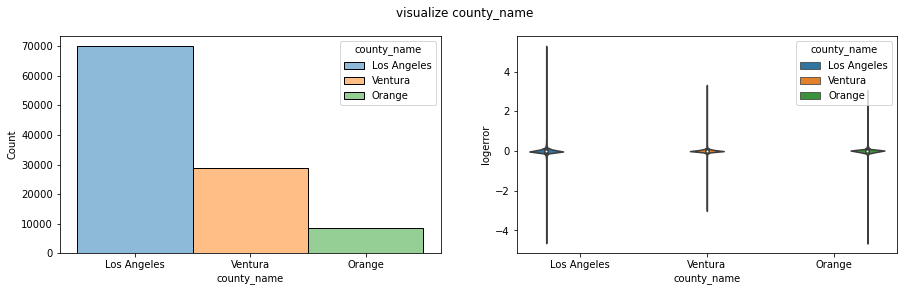

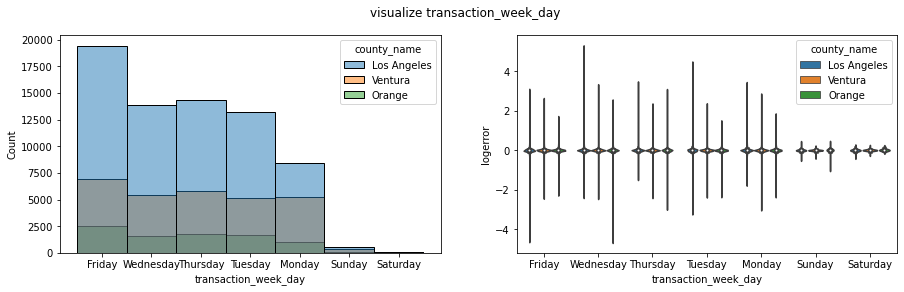

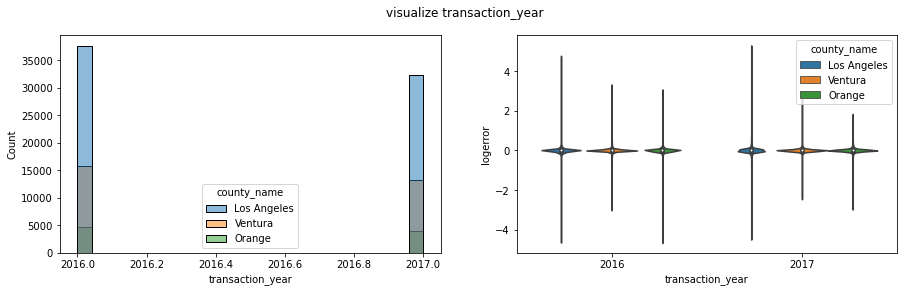

...

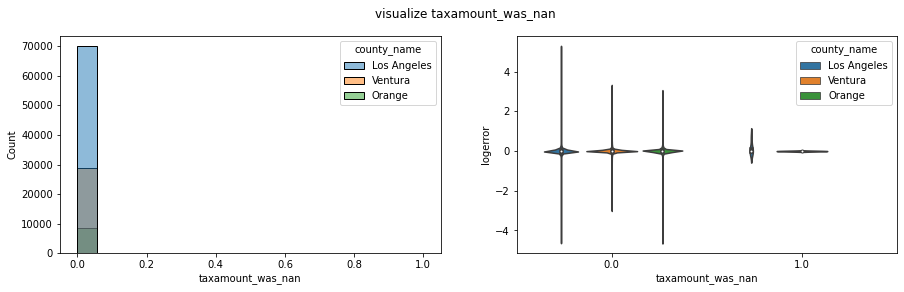

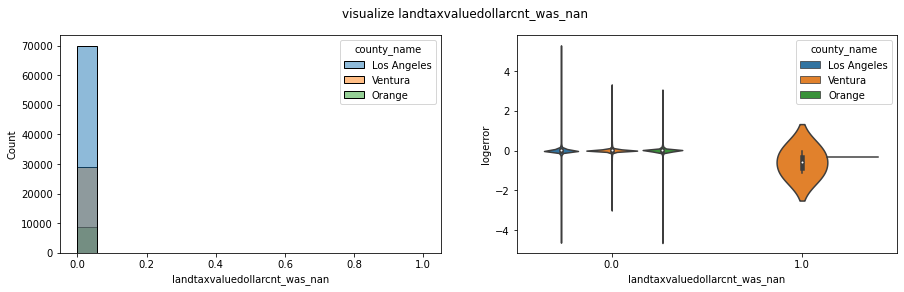

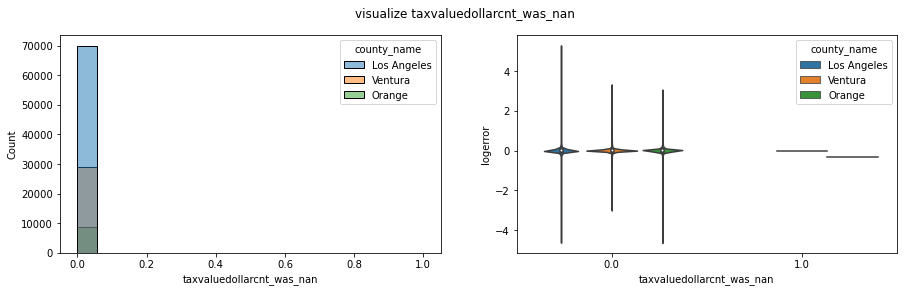

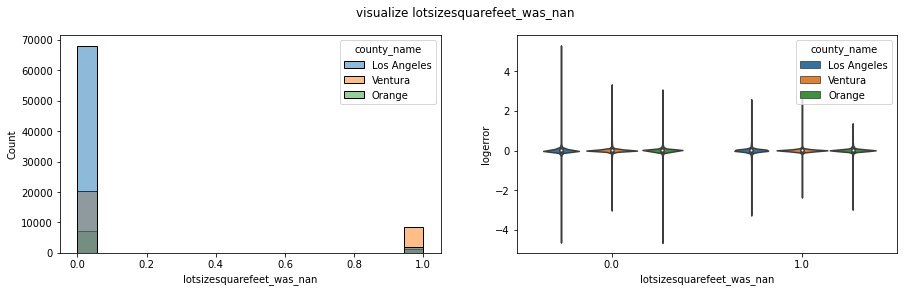

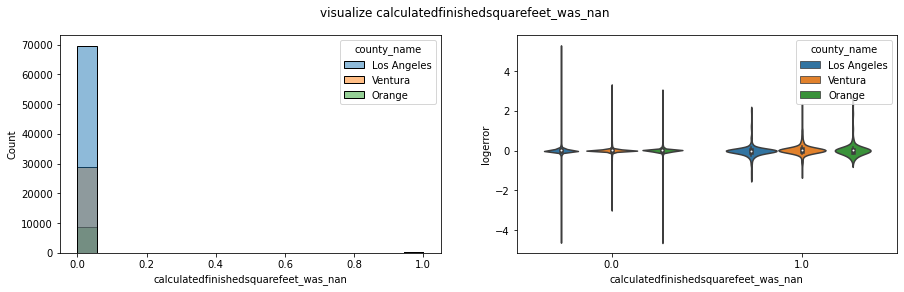

In [60]:
%matplotlib inline
import math
import matplotlib.pyplot as plt
import seaborn as sns
import Zillow.data as zd
from Zillow.types import MoreFeatures as mft

n_rows = math.ceil( len(plotting_categorical_features)/2 )

for label in plotting_categorical_features:
    fig, axs = plt.subplots(ncols=2, figsize=(15, 4))
    sns.histplot(x=label, data=df, ax=axs[0],hue=mft.county_name.value );
    sns.violinplot(x=label, y='logerror', data=df, ax=axs[1],hue=mft.county_name.value )
    plt.suptitle(f"visualize {label}")

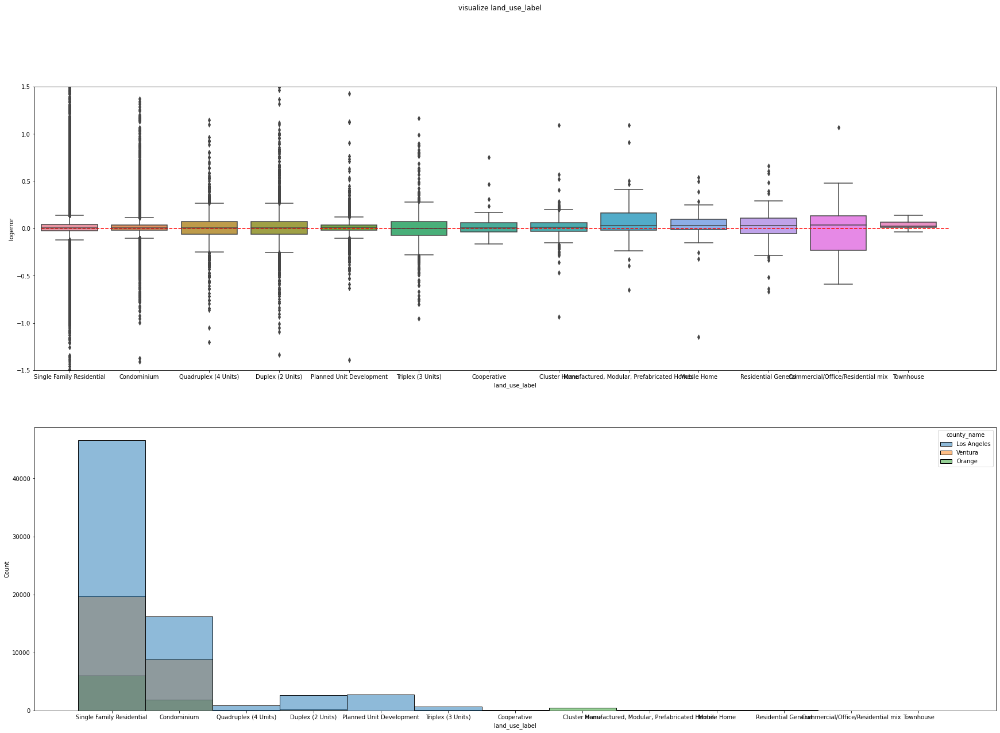

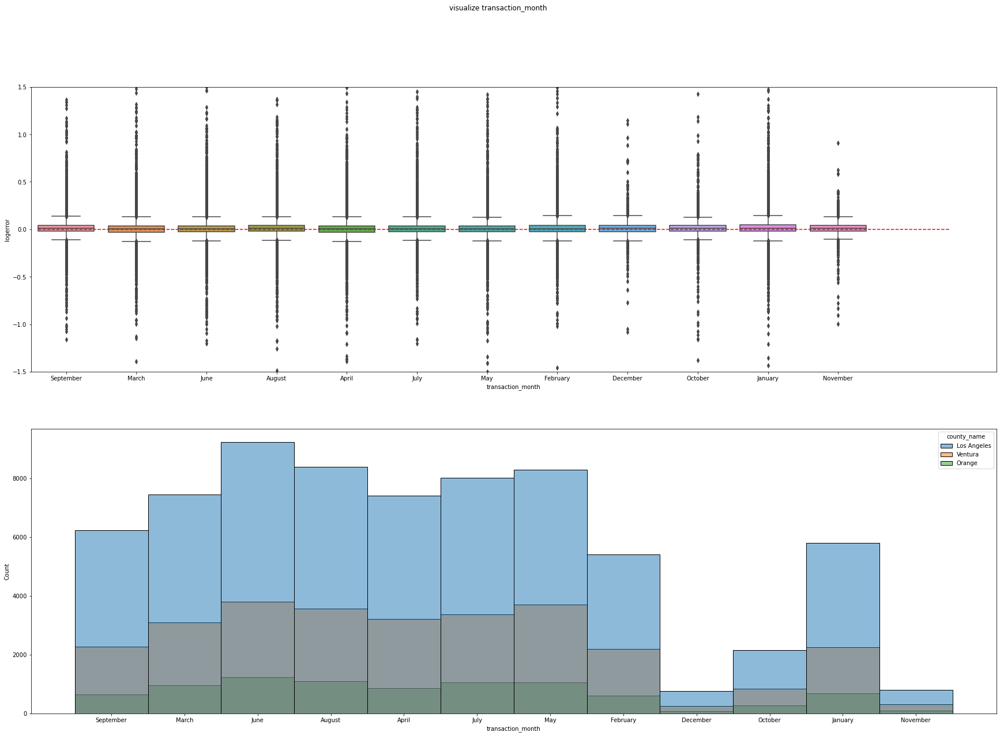

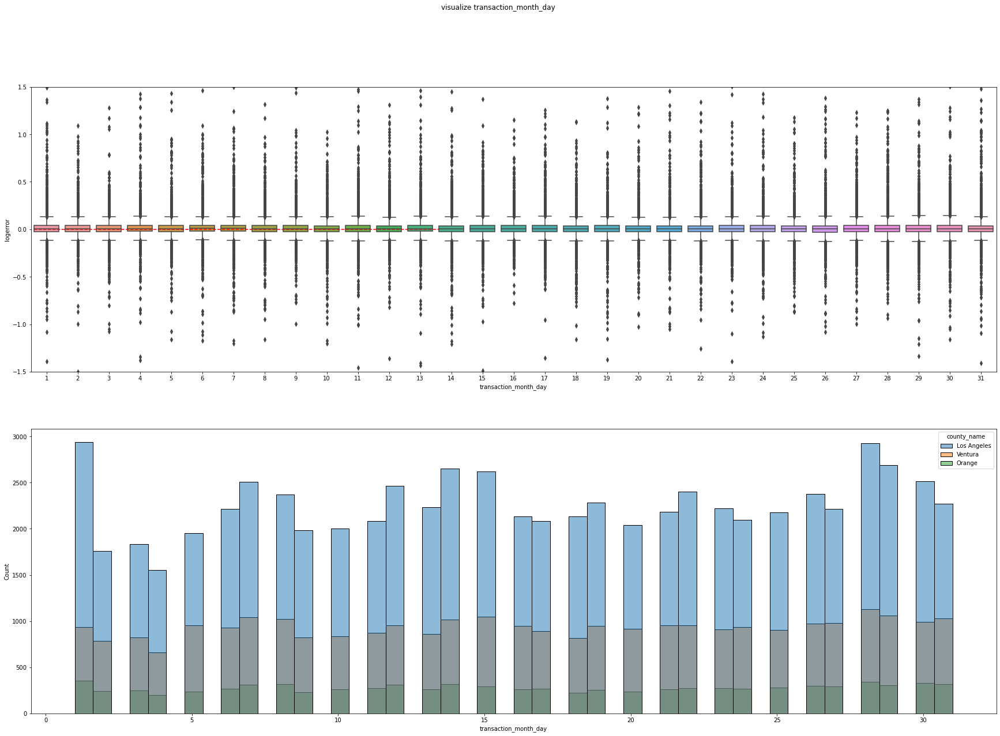

In [61]:
for label in ['land_use_label', 'transaction_month', 'transaction_month_day']:
    fig, axs = plt.subplots(nrows=2, figsize=(30, 20))
    sns.histplot(x=label, data=df, ax=axs[1],hue=mft.county_name.value );
    sns.boxplot(x=label, y='logerror', data=df, ax=axs[0])
    axs[0].hlines(0., xmin=-0.4, xmax=12.6, colors='red', linestyles='dashed');
    axs[0].set_ylim(-1.5, 1.5)
    plt.suptitle(f"visualize {label}")

È importante notare che la distribuzione di tipologia delle proprietà è per piccoli cluster (cioè si riscontra che la città è divisa in quartieri residenziali, aree industriali, zone commerciali, ...). Confrontando con le mappe di prima, seppure vi sia una distribuzione del logerror abbastanza omogenea, sembra che in alcuni luoghi si concentri maggiormente: l'area delle spiagge a Nord, vicino a Santa Monica ha logerror positivi più frequenti in corrispondenza di *cluster home* o condomini.

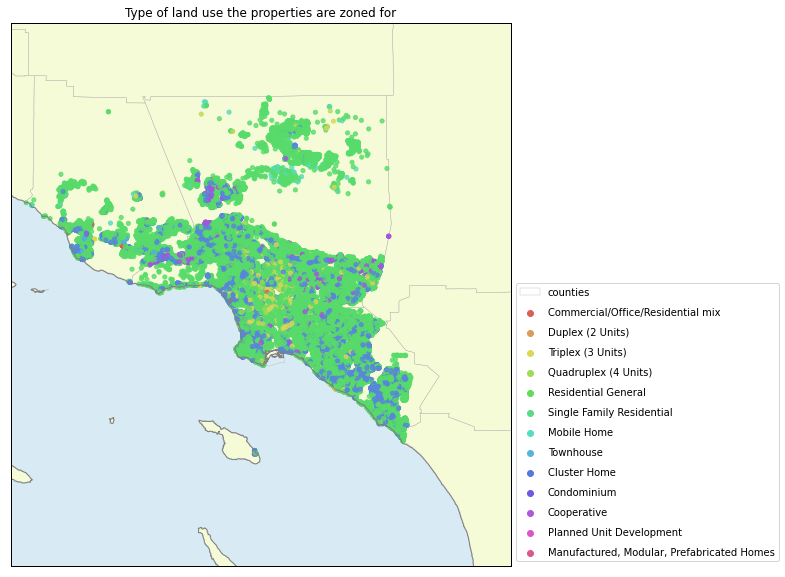

In [62]:
import Zillow.data as zd
from Zillow.visualization import ZillowMap, create_labels_for_non_zero_land_use_types

fig, axs = plt.subplots(ncols=1,figsize=(15,10))

clrs_for_scatter = sns.color_palette('hls', n_colors=13, as_cmap=True)
clrs_for_legend  = sns.color_palette('hls', n_colors=13)

axs.set_title("Type of land use the properties are zoned for")
m = ZillowMap(ax=axs)

labels, map_labels = create_labels_for_non_zero_land_use_types(df)

points = m.scatter(df.longitude,
                   df.latitude,
                   latlon=True,
                   c=df['land_use_label'].replace(map_labels),
                   s=17.,
                   alpha=0.8,
                   cmap=clrs_for_scatter)

# legenda
for i in range(13):
    axs.scatter([],[], label=list(labels.values())[i], color=clrs_for_legend[i])
axs.legend(scatterpoints=1, labelspacing=1, loc='lower left', bbox_to_anchor=(1,0));